# 逐过程仿真 —— 光源 → 相位调控 → 大气 → 目标（漫反射）→ 返回大气 → 成像

基于 OOPAO 库和 beaconless-ao-sim 项目的物理仿真模块，逐步展示完整的光路仿真。

参考文献：DiComo 等, Opt. Express 33(15):31010 (2025)

## 仿真原理与 OOPAO 库简介

本笔记本完整复现 **无信标自适应光学（beaconless AO）** 的双向光路：

```
光源(入瞳高斯) → 相位调控(变形镜简化) → 大气前向(10层湍流屏) → 目标(漫反射)
                                                                    │
焦面成像 ← 物镜(f_obj) ← 望远镜入瞳(ΦD) ← 返回大气(同屏反向) ←────┘
```

物理原理（详见 DiComo et al., Opt. Express 33(15):31010, 2025）：

- **分步传播 (split-step)**：光场每穿过一层湍流屏，先自由传播 `dz/2`、乘上
  `exp(iφ)` 相位屏、再传播 `dz/2`（`physics/propagation_fft.py` 的 `Propagator`）。
- **湍流屏 (OOPAO)**：由 **OOPAO** 库的 `Atmosphere` 类生成（von-Karman 谱、
  多层、按种子确定性抽样），每个子屏中心裁剪到 512×512 并缩放至各 slab r0
  （见 `physics/oopao_backend.py` 的 `OopaoScreenBackend`）。
- **变形镜简化**：OOPAO 不在模块范围内提供 DM，因此把变形镜建模为**纯相位调控**
  `E_out = E_in · exp(iφ_ctrl)`（一个理想相位型 DM）。
- **望远成像（§6）**：返回场在入瞳处用出射相位共轭准直 → 物镜施加二次相位
  `exp(-i k r²/(2f_obj))` → 角谱传播到焦面及焦前/焦后 ±z_R 平面（多平面成像，
  正是 CNN 感知折射率起伏的信息载体）。
- **FOM**（§7）：焦面桶内能量占比，衡量像质。

### OOPAO 库的使用

参考官方教程与文档：

- 教程目录: <https://github.com/cheritier/OOPAO/tree/master/tutorials>
- 成像示例 `image_formation.py`:
  <https://github.com/cheritier/OOPAO/blob/master/tutorials/image_formation.py>
- 配置望远镜 `how_to_configure_a_telescope.py`:
  <https://github.com/cheritier/OOPAO/blob/master/tutorials/how_to_configure_a_telescope.py>
- AO 闭环示例 `AO_closed_loop_3_corrector_types.py`:
  <https://github.com/cheritier/OOPAO/blob/master/tutorials/AO_closed_loop_3_corrector_types.py>

本项目只用到 OOPAO 的 **Atmosphere（湍流屏）** 部分；`Telescope`/`Source`
作为兼容层保留（`physics/_oopao_compat.py`），FFT 传播与成像为本项目自研。


## §0 环境准备与配置加载

In [1]:
import sys
import os
from pathlib import Path
import yaml
import numpy as np
import matplotlib.pyplot as plt
import matplotlib

get_ipython().run_line_magic('matplotlib', 'inline')

# 项目路径设置
project_root = Path(".").resolve().parent  # 假设 notebook 在 data/ 目录下
if not (project_root / "physics").exists():
    project_root = Path(".").resolve()  # 如果在项目根目录
if str(project_root) not in sys.path:
    sys.path.insert(0, str(project_root))

print(f"项目根目录: {project_root}")

项目根目录: D:\Projects\TIFO\beaconless-ao-sim


In [2]:
# 中文字体：避免 matplotlib 默认 DejaVu Sans 缺少 CJK 字形
import matplotlib as _mpl
import matplotlib.font_manager as _fm

_cjk_candidates = ['Microsoft YaHei', 'Microsoft YaHei UI',
                   'SimHei', 'SimSun', 'NSimSun',
                   'Source Han Sans CN', 'Source Han Sans SC',
                   'Noto Sans CJK SC', 'PingFang SC', 'Heiti SC',
                   'WenQuanYi Micro Hei', 'Arial Unicode MS']
_available = {f.name for f in _fm.fontManager.ttflist}
_picked = [f for f in _cjk_candidates if f in _available]
if _picked:
    _cjk_name = _picked[0]
    _mpl.rcParams['font.family'] = _cjk_name
    _mpl.rcParams['font.sans-serif'] = [_cjk_name] + _picked + ['DejaVu Sans']
    _mpl.rcParams['axes.unicode_minus'] = False
    CN_FONT = _cjk_name
    print('CJK 字体:', _cjk_name)
else:
    _mpl.rcParams['font.sans-serif'] = ['DejaVu Sans']
    _mpl.rcParams['axes.unicode_minus'] = False
    CN_FONT = None
    print('警告: 未找到 CJK 字体，中文可能仍为方块')

CJK 字体: Microsoft YaHei


In [3]:
# 语言标签
if CN_FONT:
    LABEL = {
        "src": "§1 光源", "amp": "光束幅度 |E0|²", "ph": "光束相位 (rad)",
        "pup": "孔径掩膜", "dm": "§2 变形镜", "dm_ph": "DM 校正相位 (rad)",
        "ci": "校正后强度", "fwd": "§3 大气传播（前向）",
        "scr": "湍流屏", "tgt": "目标面强度", "vac": "真空参考强度",
        "sct": "§4 目标漫反射", "rph": "粗糙面相位 (rad)",
        "ret": "§5 返回大气传播", "ri": "返回面强度",
        "img": "§6 成像系统", "im": "成像平面",
        "fom": "§7 FOM 对比", "fomv": "FOM",
        "px": "像素", "nm": "Noll 模式", "co": "系数 (rad)",
        "no": "无 AO", "tk": "仅跟踪", "bc": "信标共轭",
        "z78": "78 阶 Zernike",         "title_light_path": "光线传播路径总览",
        "title_ret_evol": "返回路径 I/φ 演化",
        "ret_intensity": "返回强度 (log10)",
        "ret_phase": "返回相位 (rad)",
        "title_dist_imaging": "不同距离远端光斑成像",
        "dist_image": "成像",
        "title_star": "§8 五角星光源望远成像",
        "star_no_turb": "无湍流",
        "star_with_turb": "有湍流",
        "star_source": "五角星光源",
        "star_diff_limit": "衍射极限 PSF",
        "star_turb_psf": "湍流 PSF",
        "xlabel_arcsec": "弧秒 (arcsec)",
        "ylabel_arcsec": "弧秒","dm_c": "DM 校正",
    }
else:
    LABEL = {
        "src": "S1 Light Source", "amp": "|E0|2", "ph": "Phase (rad)",
        "pup": "Pupil Mask", "dm": "S2 Deformable Mirror", "dm_ph": "DM Phase (rad)",
        "ci": "Corrected Intensity", "fwd": "S3 Atmosphere (Forward)",
        "scr": "Screen", "tgt": "Target Intensity", "vac": "Vacuum Reference",
        "sct": "S4 Target Diffuse", "rph": "Roughness Phase (rad)",
        "ret": "S5 Return Atmosphere", "ri": "Return Intensity",
        "img": "S6 Imaging System", "im": "Image Plane",
        "fom": "S7 FOM Comparison", "fomv": "FOM",
        "px": "Pixel", "nm": "Noll Mode", "co": "Coefficient (rad)",
        "no": "No AO", "tk": "Track Only", "bc": "Beacon Conj.",
        "z78": "Z78 (78-mode)",         "title_light_path": "Light Path Overview",
        "title_ret_evol": "Return Path I/phi Evolution",
        "ret_intensity": "Return Intensity (log10)",
        "ret_phase": "Return Phase (rad)",
        "title_dist_imaging": "Distance-Resolved Imaging",
        "dist_image": "Image",
        "title_star": "Star-Source Telescope Imaging",
        "star_no_turb": "No Turb.",
        "star_with_turb": "With Turb.",
        "star_source": "Star Source",
        "star_diff_limit": "Diffraction-Limit PSF",
        "star_turb_psf": "Turbulent PSF",
        "xlabel_arcsec": "Arcsec",
        "ylabel_arcsec": "Arcsec","dm_c": "DM Correction",
    }

In [4]:
from physics.propagation_fft import Propagator
from physics.zernike_aotools import ZernikeBasis
from physics.scattering import random_roughness_phase
from physics.screens_soapy import compute_r0
from physics.oopao_backend import OopaoScreenBackend
from utils.metrics import FOM, bucket_mask

print("物理模块导入完成")

CuPy is not found, using NumPy backend...
物理模块导入完成


In [5]:
# 加载配置
with open(project_root / "config.yaml", "r", encoding="utf-8") as f:
    cfg = yaml.safe_load(f)

p = cfg["physical"]
img_cfg = cfg["imaging"]
b = cfg["bucket"]

# 基本量
N = int(p["N"])
dx = float(p["box_size"]) / N
lam = float(p["wavelength"])
k = 2.0 * np.pi / lam
rspot = float(p["rspot"])
focal = float(p["focal"])
L = float(p["L"])
Dscope = float(p["Dscope"])
N_MODES = 78

print(f"N={N}, λ={lam*1e9:.0f}nm, L={L:.0f}m, D={Dscope:.2f}m")
print(f"rspot={rspot*100:.1f}cm, focal={focal:.0f}m")

N=512, λ=800nm, L=1000m, D=0.30m
rspot=7.5cm, focal=1000m


In [6]:
# 坐标网格与孔径
x = (np.arange(N) - (N - 1) / 2.0) * dx
X, Y = np.meshgrid(x, x)
r2 = X**2 + Y**2
pupil = r2 <= (Dscope / 2.0) ** 2

# 入瞳光束：高斯幅度，孔径外置零
E0 = np.exp(-(r2 / rspot**2)).astype(np.complex64)
E0[~pupil] = 0.0

# 聚焦相位
phi_focus = (-k * r2 / (2.0 * focal)).astype(np.float64)

# 倾斜跟踪高斯权重
G = np.exp(-(r2 / rspot**2))

# 传播器 & Zernike 基底
print("构建传播器...")
prop = Propagator(N, dx, lam)
zern = ZernikeBasis(N, N_MODES)

# 成像几何
r0 = compute_r0(lam, float(p["cn2"]), L)
zR_APWS = img_cfg["zR_APWS"] if img_cfg["zR_APWS"] is not None else r0**2 / (np.pi * lam)
f_obj = img_cfg["f_obj"] if img_cfg["f_obj"] is not None else 2.0 * zR_APWS
plane_offsets = np.array(
    [f_obj + (frac - 1.0) * zR_APWS for frac in img_cfg["plane_offset_frac"]],
    dtype=np.float64,
)

# FOM 桶掩膜
D_bucket = float(b["diameter_frac"]) * L * lam / Dscope
diameter_px = D_bucket / dx
bmask = bucket_mask(N, diameter_px)

# 真空目标面强度
I_vac = prop.angular_spectrum_intensity(
    (E0 * np.exp(1j * phi_focus)).astype(np.complex64), L
)

# OOPAO 大气后端
oopao = OopaoScreenBackend(
    N=N, dx=dx, Dscope=Dscope, lam=lam,
    cn2=float(p["cn2"]), L=L, L0=float(p["L0"]),
    n_screens=int(p["n_screens"]),
)

print(f"初始化完成: r₀={r0*100:.1f}cm, z_R={zR_APWS:.1f}m, f_obj={f_obj:.1f}m")

构建传播器...



------------ Telescope -------------
Diameter [m]             |   1.00   
Resolution [px]          |    8     
Pixel size [m]           |   0.12   
Surface [m²]             |   0.81   
Central obstruction [%]  |    0     
Pixels in pupil          |    52    
Field of view [arcsec]   |   0.00   
------------------------------------


------------ Telescope -------------
Diameter [m]             |   0.30   
Resolution [px]          |   512    
Pixel size [m]           |   0.00   
Surface [m²]             |   0.07   
Central obstruction [%]  |    0     
Pixels in pupil          |  205892  
Field of view [arcsec]   |   0.00   
------------------------------------

Creation of layer1/10 ...
-> Computing the initial phase screen...


initial phase screen : 0.19319725036621094 s
Creation of layer2/10 ...
-> Computing the initial phase screen...
initial phase screen : 0.19177031517028809 s


Creation of layer3/10 ...
-> Computing the initial phase screen...
initial phase screen : 0.1877460479736328 s
Creation of layer4/10 ...
-> Computing the initial phase screen...


initial phase screen : 0.17802119255065918 s
Creation of layer5/10 ...
-> Computing the initial phase screen...
initial phase screen : 0.1870732307434082 s
Creation of layer6/10 ...
-> Computing the initial phase screen...


initial phase screen : 0.18762922286987305 s
Creation of layer7/10 ...
-> Computing the initial phase screen...
initial phase screen : 0.1874253749847412 s
Creation of layer8/10 ...
-> Computing the initial phase screen...


initial phase screen : 0.19001197814941406 s
Creation of layer9/10 ...
-> Computing the initial phase screen...
initial phase screen : 0.17908334732055664 s
Creation of layer10/10 ...
-> Computing the initial phase screen...


initial phase screen : 0.18301892280578613 s
Updating the Atmosphere covariance matrices...



------------------------- Atmosphere @ Elevation = 90.0°--------------------------
 Layer | Direction | Speed | Altitude | Frac Cn² | Diameter |     Evolution      |
       |    [°]    | [m/s] |   [m]    |   [%]    |   [m]    |                    |
   1   |     0     | 10.0  |  5e+01   |    10    |  0.302   |    Frozen Flow     |
   2   |     0     | 10.0  |  2e+02   |    10    |  0.302   |    Frozen Flow     |
   3   |     0     | 10.0  |  2e+02   |    10    |  0.302   |    Frozen Flow     |
   4   |     0     | 10.0  |  4e+02   |    10    |  0.302   |    Frozen Flow     |
   5   |     0     | 10.0  |  4e+02   |    10    |  0.302   |    Frozen Flow     |
   6   |     0     | 10.0  |  6e+02   |    10    |  0.302   |    Frozen Flow     |
   7   |     0     | 10.0  |  6e+02   |    10    |  0.302   |    Frozen Flow     |
   8   |     0     | 10.0  |  8e+02   |    10    |  0.302   |    Frozen Flow     |
   9   |     0     | 10.0  |  8e+02   |    10    |  0.302   |    Frozen Flow     |
  1

## 光线传播路径总览

下面这张侧视示意图把整条双向链路画在一起：**①光源/入瞳 → ②相位调控 →
③大气前向(10层屏) → ④目标(漫反射) → ⑤返回大气(同屏反向) →
⑥望远镜入瞳 → ⑦物镜 → ⑧焦面多平面成像**。


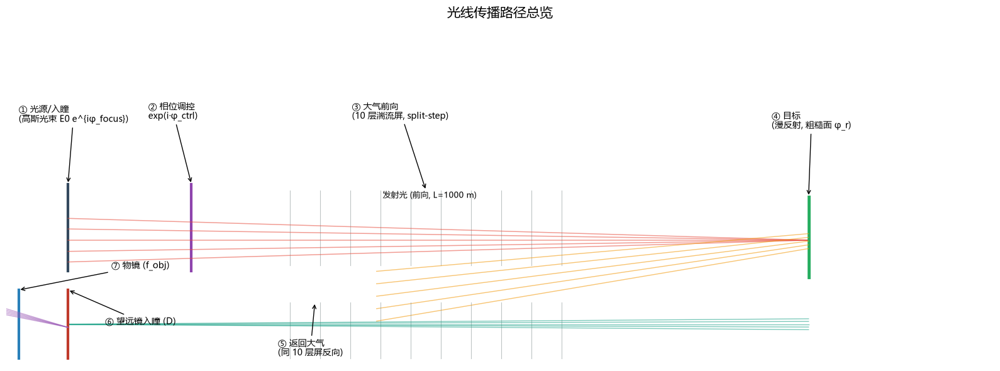

In [7]:
# 光线传播路径总览示意图（纯教学示意，无物理网格）
fig, ax = plt.subplots(figsize=(16, 6))
ax.set_xlim(0, 16)
ax.set_ylim(-2, 3.5)
ax.axis("off")

# 第 1 行：前向发射（左 → 右）
ax.plot([1, 1], [-0.5, 0.9], color="#34495e", lw=3)
ax.annotate("① 光源/入瞳\n(高斯光束 E0 e^{iφ_focus})",
            xy=(1, 0.9), xytext=(0.2, 1.9), fontsize=10,
            arrowprops=dict(arrowstyle="->"))
ax.plot([3, 3], [-0.5, 0.9], color="#8e44ad", lw=3)
ax.annotate("② 相位调控\nexp(i·φ_ctrl)", xy=(3, 0.9), xytext=(2.3, 1.95), fontsize=10,
            arrowprops=dict(arrowstyle="->"))
for x_s in np.linspace(4.6, 9.0, 10):
    ax.plot([x_s, x_s], [-0.4, 0.8], color="#7f8c8d", lw=0.8, alpha=0.5)
ax.annotate("③ 大气前向\n(10 层湍流屏, split-step)",
            xy=(6.8, 0.8), xytext=(5.6, 1.95), fontsize=10,
            arrowprops=dict(arrowstyle="->"))
for y_off in (-0.35, -0.18, 0.0, 0.18, 0.35):
    ax.plot([1.0, 13.0], [y_off, 0.0], color="#e74c3c", lw=1.1, alpha=0.55)
ax.annotate("发射光 (前向, L=1000 m)", xy=(7.0, 0.5), xytext=(6.1, 0.68), fontsize=9)

# 目标（漫反射）
ax.plot([13, 13], [-0.6, 0.7], color="#27ae60", lw=3.5)
ax.annotate("④ 目标\n(漫反射, 粗糙面 φ_r)",
            xy=(13, 0.7), xytext=(12.4, 1.8), fontsize=10,
            arrowprops=dict(arrowstyle="->"))
for y_off in (-0.45, -0.25, -0.05, 0.15, 0.35):
    ax.plot([13.0, 6.0], [y_off * 0.3, y_off - 0.85], color="#f39c12", lw=1.0, alpha=0.6)

# 第 2 行：返回大气（右 → 左，屏复用）
for x_s in np.linspace(9.0, 4.6, 10):
    ax.plot([x_s, x_s], [-1.9, -1.0], color="#7f8c8d", lw=0.8, alpha=0.5)
ax.annotate("⑤ 返回大气\n(同 10 层屏反向)",
            xy=(5.0, -1.0), xytext=(4.4, -1.85), fontsize=10,
            arrowprops=dict(arrowstyle="->"))
for y_off in (-0.35, -0.18, 0.0, 0.18, 0.35):
    ax.plot([13.0, 1.0], [-1.35 - y_off * 0.25, -1.35], color="#16a085", lw=1.0, alpha=0.55)

# 第 3 行：望远镜成像（x≈1 附近，向左聚焦）
ax.plot([1.0, 1.0], [-1.9, -0.8], color="#c0392b", lw=3)
ax.annotate("⑥ 望远镜入瞳 (D)", xy=(1, -0.8), xytext=(1.6, -1.35), fontsize=10,
            arrowprops=dict(arrowstyle="->"))
ax.plot([0.2, 0.2], [-1.9, -0.8], color="#2980b9", lw=3)
ax.annotate("⑦ 物镜 (f_obj)", xy=(0.2, -0.8), xytext=(1.7, -0.45), fontsize=10,
            arrowprops=dict(arrowstyle="->"))
for y_off in (-0.3, -0.15, 0.0, 0.15, 0.3):
    ax.plot([1.0, -1.8], [-1.4, y_off * 0.45 - 0.7], color="#9b59b6", lw=1.0, alpha=0.55)
ax.plot([-1.8, -1.8], [-1.1, -0.3], color="#f1c40f", lw=2.5)
ax.annotate("⑧ 焦面成像\n(f_obj ± z_R 多平面)",
            xy=(-1.8, -0.3), xytext=(-3.2, 0.5), fontsize=10,
            arrowprops=dict(arrowstyle="->"))

ax.set_title(LABEL["title_light_path"], fontsize=15)
plt.tight_layout()
plt.show()


**图 0 · 光线传播路径总览（教学示意，非物理网格）**

整条双向链路示意：**① 光源/入瞳（高斯光束）→ ② 相位调控（变形镜简化）→ ③ 大气前向传播（10 层湍流屏，间隔 100 m，共 1 km）→ ④ 目标漫反射 → ⑤ 返回大气传播（反向穿过同一组屏）→ ⑥ 望远镜入瞳 → ⑦ 物镜聚焦 → ⑧ 焦面附近多平面成像**。前向为实线、返回为虚线；后续 §1–§8 各节逐一对应此链路的每个环节。

In [8]:
# 生成湍流相位屏
seed = 42
screens = oopao.make_screens(seed)
screen_sep = L / screens.shape[0]

print(f"湍流屏: {screens.shape}, 屏间距={screen_sep:.0f}m")
print(f"D/r₀ = {Dscope / r0:.1f}")

湍流屏: (10, 512, 512), 屏间距=100m
D/r₀ = 7.5


## §1 光源 —— 生成入瞳高斯光束

入瞳峰值强度 = 0.999939
通光面积占比 = 78.5%


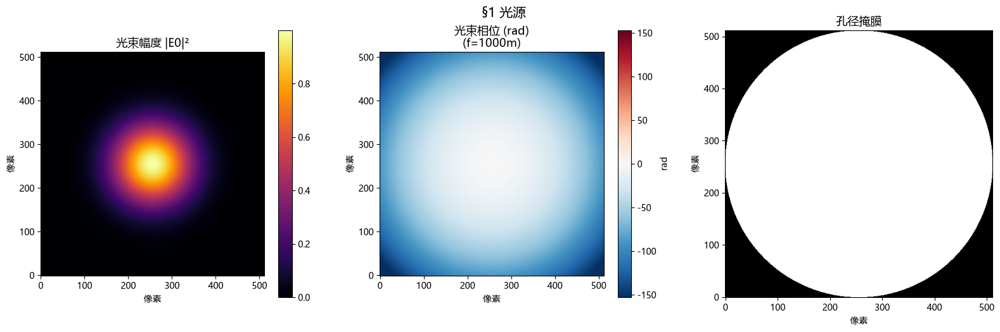

In [9]:
I0 = (np.abs(E0)**2).astype(np.float32)
print(f"入瞳峰值强度 = {I0.max():.6f}")
print(f"通光面积占比 = {pupil.sum() / N**2 * 100:.1f}%")

fig, axes = plt.subplots(1, 3, figsize=(16, 5))

# 光束强度
im0 = axes[0].imshow(I0, cmap="inferno", origin="lower")
axes[0].set_title(LABEL["amp"], fontsize=13)
axes[0].set_xlabel(LABEL["px"]); axes[0].set_ylabel(LABEL["px"])
plt.colorbar(im0, ax=axes[0])

# 聚焦相位
vmax = float(np.percentile(np.abs(phi_focus), 99))
im1 = axes[1].imshow(phi_focus, cmap="RdBu_r", vmin=-vmax, vmax=vmax, origin="lower")
axes[1].set_title(f"{LABEL['ph']}\n(f={focal:.0f}m)", fontsize=13)
axes[1].set_xlabel(LABEL["px"]); axes[1].set_ylabel(LABEL["px"])
plt.colorbar(im1, ax=axes[1], label="rad")

# 孔径掩膜
axes[2].imshow(pupil.astype(float), cmap="gray", origin="lower")
axes[2].set_title(LABEL["pup"], fontsize=13)
axes[2].set_xlabel(LABEL["px"]); axes[2].set_ylabel(LABEL["px"])

plt.tight_layout()
plt.suptitle(LABEL["src"], fontsize=15, y=1.02)
plt.show()

**图 §1 · 入瞳高斯光束（光路起点）**

三个面板依次为：
- **左｜光束幅度**：入瞳强度 $|E_0|^2$，径向高斯分布（束腰 `rspot = 7.5 cm`），峰值 `0.9999`；因孔径裁剪，通光面积占比 `78.5%`（$D_\mathrm{tel}$ = 0.30 m 圆孔径；网格 N=512、dx=5.86e-4 m）。
- **中｜聚焦相位**：$\phi_\mathrm{focus}=-k r^2/(2f)$，$f = 1000$ m（聚焦于目标面，论文表 1）；RdBu_r 色标按 ±99 百分位截断，单位 rad。
- **右｜孔径掩膜**：`pupil` 二值掩膜（1=通光），此后所有场运算都先乘该掩膜。

## §2 相位调控 —— 变形镜简化模型

OOPAO 仅提供 Atmosphere/Source/Telescope 三个类（见 _oopao_compat）。
本仿真不建模变形镜执行器几何，将其简化为**纯相位调控**：
任意相位屏 φ 施加到光场（E_out = E_in · exp(iφ)），
等价于理想相位型 DM。此处用衍射极限信标反向传播 → 相位共轭。


In [10]:
# 衍射极限信标反向传播
w = lam * L / Dscope  # 信标束腰
E_beacon = (np.exp(-r2 / w**2) * pupil).astype(np.complex64)
E_back = prop.split_step(E_beacon, screens[::-1], -screen_sep)

# 解析移除球面波
spherical = k * r2 / (2.0 * L)
E_flat = E_back * np.exp(1j * spherical)

# 相位解卷绕（简化 BFS）
from collections import deque
phi_raw = np.angle(E_flat)
I_beacon = (np.abs(E_back)**2).astype(np.float64)

def simple_unwrap(phi_wrapped, quality):
    N_ = phi_wrapped.shape[0]
    unwrapped = np.zeros_like(phi_wrapped)
    done = np.zeros((N_, N_), dtype=bool)
    i0, j0 = np.unravel_index(np.argmax(quality), quality.shape)
    unwrapped[i0, j0] = phi_wrapped[i0, j0]
    done[i0, j0] = True
    queue = deque([(i0, j0)])
    while queue:
        ci, cj = queue.popleft()
        for di, dj in [(1,0),(-1,0),(0,1),(0,-1)]:
            ni, nj = ci+di, cj+dj
            if 0<=ni<N_ and 0<=nj<N_ and not done[ni,nj]:
                diff = phi_wrapped[ni,nj] - unwrapped[ci,cj]
                diff = diff - 2*np.pi*np.round(diff/(2*np.pi))
                unwrapped[ni,nj] = unwrapped[ci,cj] + diff
                done[ni,nj] = True
                queue.append((ni,nj))
    return unwrapped

phi_unwrapped = simple_unwrap(phi_raw, I_beacon)
phi_unwrapped -= phi_unwrapped[pupil].mean()

# 倾斜跟踪
# 信标相位共轭：与 scripts/逐过程仿真.py 的 phi_conj 逐行对齐（负号共轭）
phi_conj = -phi_unwrapped
# 倾斜跟踪（在共轭相位上拟合，符号与脚本一致）
gx, gy = np.gradient(phi_conj)
a_x = float(np.sum(G * gx) / np.sum(G))
a_y = float(np.sum(G * gy) / np.sum(G))
phi_track = a_x * X + a_y * Y

phi_beacon = phi_conj - phi_track
coeffs = zern.phase_to_zernike(phi_beacon)
phi_z78 = zern.zernike_to_phase(coeffs)

# 相位调控量 = 信标相位共轭
phi_correction = phi_conj

print(f"跟踪斜率 a_x={a_x:.4f}, a_y={a_y:.4f} rad/m")
print(f"Z78 系数 RMS = {np.sqrt(np.mean(coeffs**2)):.4f} rad")

跟踪斜率 a_x=0.0031, a_y=0.0101 rad/m
Z78 系数 RMS = 0.1822 rad


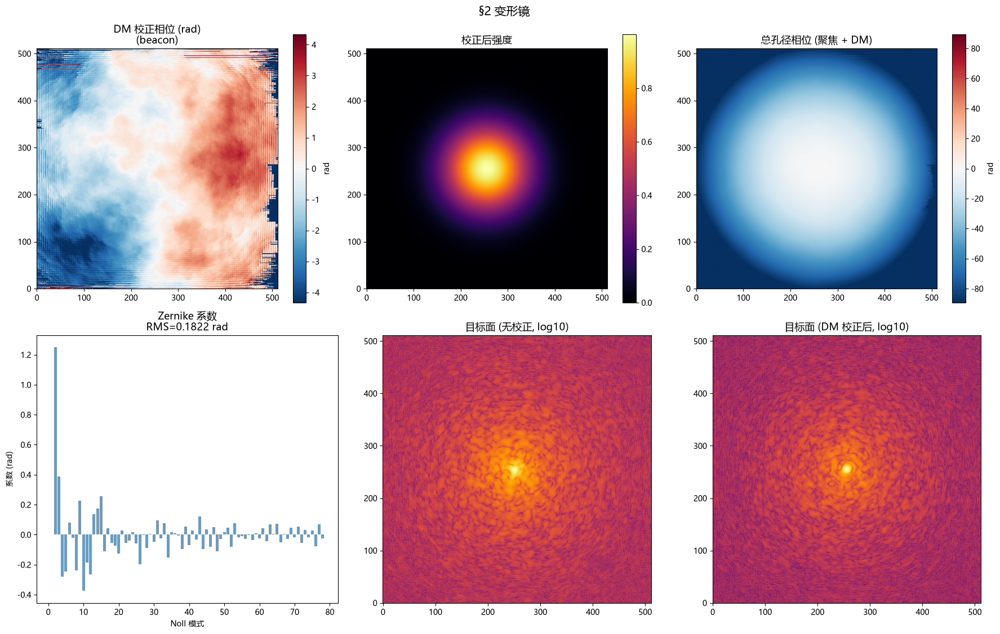

In [11]:
fig, axes = plt.subplots(2, 3, figsize=(18, 11))

# 相位调控量
vmax_dm = float(np.percentile(np.abs(phi_correction[pupil]), 99))
im0 = axes[0,0].imshow(phi_correction, cmap="RdBu_r", vmin=-vmax_dm, vmax=vmax_dm, origin="lower")
axes[0,0].set_title(LABEL["dm_ph"]+"\n(beacon)", fontsize=13)
plt.colorbar(im0, ax=axes[0,0], label="rad")

# 校正后强度
E_corrected = (E0 * np.exp(1j * (phi_focus + phi_correction))).astype(np.complex64)
I_corrected = (np.abs(E_corrected)**2).astype(np.float32)
im1 = axes[0,1].imshow(I_corrected, cmap="inferno", origin="lower")
axes[0,1].set_title(LABEL["ci"], fontsize=13)
plt.colorbar(im1, ax=axes[0,1])

# 总孔径相位
phi_total_dm = phi_focus + phi_correction
vmax_t = float(np.percentile(np.abs(phi_total_dm[pupil]), 99))
im2 = axes[0,2].imshow(phi_total_dm, cmap="RdBu_r", vmin=-vmax_t, vmax=vmax_t, origin="lower")
axes[0,2].set_title("总孔径相位 (聚焦 + DM)", fontsize=13)
plt.colorbar(im2, ax=axes[0,2], label="rad")

# Zernike 系数
axes[1,0].bar(np.arange(1, N_MODES+1), coeffs, width=0.8, color="steelblue", alpha=0.8)
axes[1,0].set_xlabel(LABEL["nm"]); axes[1,0].set_ylabel(LABEL["co"])
axes[1,0].set_title(f"Zernike 系数\nRMS={np.sqrt(np.mean(coeffs**2)):.4f} rad", fontsize=13)

# 校正前后目标面强度对比
E_obj_before = prop.split_step(E0 * np.exp(1j*phi_focus), screens, screen_sep)
I_obj_before = (np.abs(E_obj_before)**2).astype(np.float32)
E_obj_after = prop.split_step(E_corrected, screens, screen_sep)
I_obj_after = (np.abs(E_obj_after)**2).astype(np.float32)

axes[1,1].imshow(np.log10(np.maximum(I_obj_before, 1e-20)), cmap="inferno", origin="lower")
axes[1,1].set_title("目标面 (无校正, log10)", fontsize=13)
axes[1,2].imshow(np.log10(np.maximum(I_obj_after, 1e-20)), cmap="inferno", origin="lower")
axes[1,2].set_title("目标面 (DM 校正后, log10)", fontsize=13)

plt.tight_layout()
plt.suptitle(LABEL["dm"], fontsize=15, y=1.02)
plt.show()

**图 §2 · 变形镜简化 = 纯相位调控（信标共轭模式）**

上排（相位域）：
- **DM 校正相位**：`phi_correction = phi_conj`（= -φ_unwrapped，信标相位共轭在孔径内的部分；RdBu_r，rad）——本仿真不建模 DM 执行器几何，直接视作波前校正屏；
- **校正后强度**：入瞳面 $E_0 e^{i(\phi_\mathrm{focus}+\phi_\mathrm{correction})}$ 的强度（幅度与 §1 左图相同，仅相位被改写）；
- **总孔径相位**：聚焦 + DM 的合成相位（rad）。

下排（投影与效果）：
- **Zernike 系数**：共轭相位 $\phi_\mathrm{beacon}$ 在 78 阶 Noll 基上的投影系数（RMS 见标题）——即 CNN 的回归标签 $\Phi_{Z78}$；
- **目标面强度（无校正 / DM 校正后，log10）**：直观看到信标共轭把能量重新聚焦成中心亮斑。

## §3 大气传播（前向）—— 分步 FFT 到目标面

目标面峰值强度 = 4.479203e+02


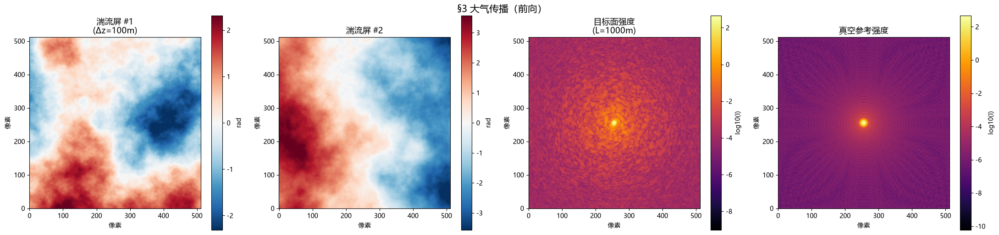

In [12]:
E_obj = prop.split_step(E_corrected, screens, screen_sep)
I_obj = (np.abs(E_obj)**2).astype(np.float32)

print(f"目标面峰值强度 = {I_obj.max():.6e}")

fig, axes = plt.subplots(1, 4, figsize=(22, 5))

# 湍流屏
vmax_s = float(np.percentile(np.abs(screens[0][pupil]), 99))
im0 = axes[0].imshow(screens[0], cmap="RdBu_r", vmin=-vmax_s, vmax=vmax_s, origin="lower")
axes[0].set_title(f"{LABEL['scr']} #1\n(Δz={screen_sep:.0f}m)", fontsize=13)
plt.colorbar(im0, ax=axes[0], label="rad")

vmax_s2 = float(np.percentile(np.abs(screens[1][pupil]), 99))
im1 = axes[1].imshow(screens[1], cmap="RdBu_r", vmin=-vmax_s2, vmax=vmax_s2, origin="lower")
axes[1].set_title(f"{LABEL['scr']} #2", fontsize=13)
plt.colorbar(im1, ax=axes[1], label="rad")

# 目标面强度
im2 = axes[2].imshow(np.log10(np.maximum(I_obj, 1e-20)), cmap="inferno", origin="lower")
axes[2].set_title(f"{LABEL['tgt']}\n(L={L:.0f}m)", fontsize=13)
plt.colorbar(im2, ax=axes[2], label="log10(I)")

# 真空参考
im3 = axes[3].imshow(np.log10(np.maximum(I_vac, 1e-20)), cmap="inferno", origin="lower")
axes[3].set_title(LABEL["vac"], fontsize=13)
plt.colorbar(im3, ax=axes[3], label="log10(I)")

for ax in axes:
    ax.set_xlabel(LABEL["px"]); ax.set_ylabel(LABEL["px"])

plt.tight_layout()
plt.suptitle(LABEL["fwd"], fontsize=15, y=1.02)
plt.show()

**图 §3 · 大气前向传播（分步 FFT 到目标面）**

- **湍流屏 #1 / #2**：前两层 von-Karman 相位屏（rad，RdBu_r，±99 百分位截断；屏间隔 `Δz = 100 m`，共 10 层）；
- **目标面强度（log10）**：DM 校正后的光束在 `L = 1000 m` 处形成的焦斑，峰值 ≈ `4.5×10²`；
- **真空参考（log10）**：无湍流、仅聚焦时的目标面强度。最后两格对比可见：加湍流后焦斑出现强度起伏与旁瓣展宽。`split_step` 在每层屏内按 dz/2 → 乘屏相位 → dz/2 完成。

## §4 目标漫反射 —— 粗糙面散射

Realization 1: peak = 4.479203e+02
Realization 2: peak = 4.479203e+02
Realization 3: peak = 4.479203e+02


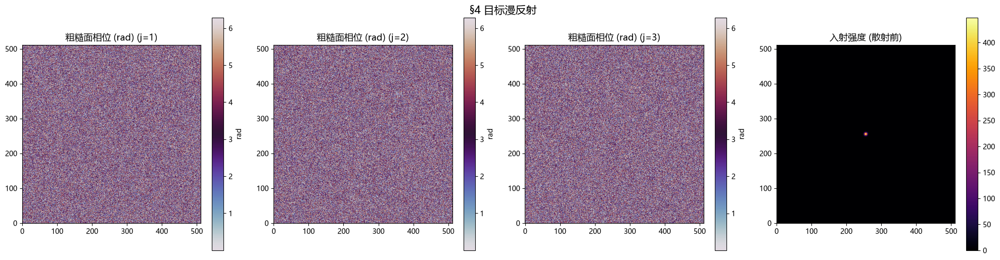

In [13]:
n_roughness = 3  # 演示用 3，论文用 10
scatter_results = []
for j in range(n_roughness):
    phi_r = random_roughness_phase((N, N), seed=(seed*31+j) % (2**32))
    E_scat = (np.sqrt(np.maximum(I_obj, 0)) * np.exp(1j*phi_r)).astype(np.complex64)
    scatter_results.append({"phi": phi_r, "E": E_scat})
    print(f"Realization {j+1}: peak = {(np.abs(E_scat)**2).max():.6e}")

fig, axes = plt.subplots(1, n_roughness + 1, figsize=(5*(n_roughness+1), 5))
for j in range(n_roughness):
    im = axes[j].imshow(scatter_results[j]["phi"], cmap="twilight", origin="lower")
    axes[j].set_title(f"{LABEL['rph']} (j={j+1})", fontsize=13)
    plt.colorbar(im, ax=axes[j], label="rad")
im = axes[n_roughness].imshow(I_obj, cmap="inferno", origin="lower")
axes[n_roughness].set_title("入射强度 (散射前)", fontsize=13)
plt.colorbar(im, ax=axes[n_roughness])

plt.tight_layout()
plt.suptitle(LABEL["sct"], fontsize=15, y=1.02)
plt.show()

**图 §4 · 目标漫反射（粗糙面散射）**

演示用 `n_roughness = 3` 个随机粗糙相位 realization（论文用 10）：
- **前 3 格**：各 realization 的粗糙面相位（twilight 色标，±π 包裹，rad），由 `random_roughness_phase` 以 `seed*31+j` 派生；
- **末格**：入射强度（散射前的目标面强度 $I_\mathrm{obj}$）。返回光场 $E_\mathrm{scat} = \sqrt{I_\mathrm{obj}}\, e^{i\phi_r}$ 随 realization 变化 → §5 对多个 realization 取平均以压低散斑。

## §5 返回大气传播 —— 反向传播到望远镜入瞳

反向穿过湍流屏后用 `pupil` 掩膜吸收边界，模拟有限口径望远镜接收（与脚本 step5 一致）。

Realization 1: return peak = 1.469873e+00


Realization 2: return peak = 1.586226e+00


Realization 3: return peak = 1.830848e+00


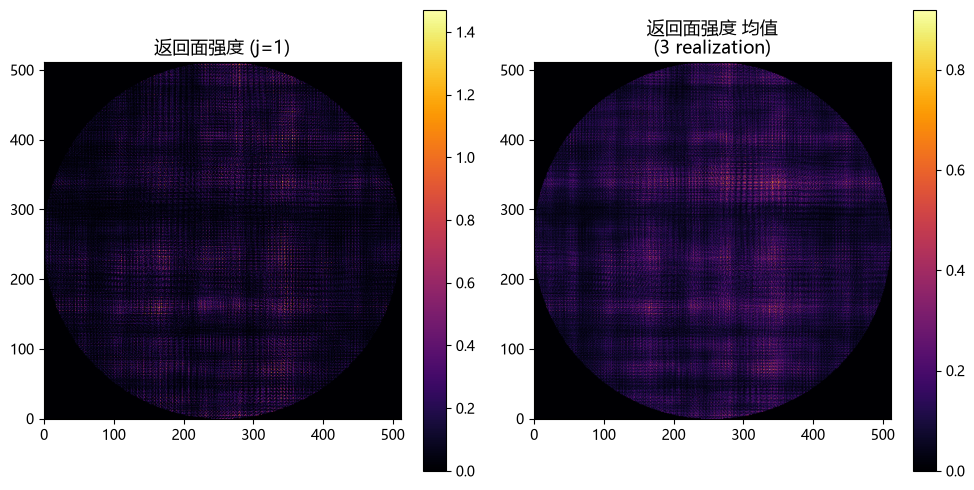

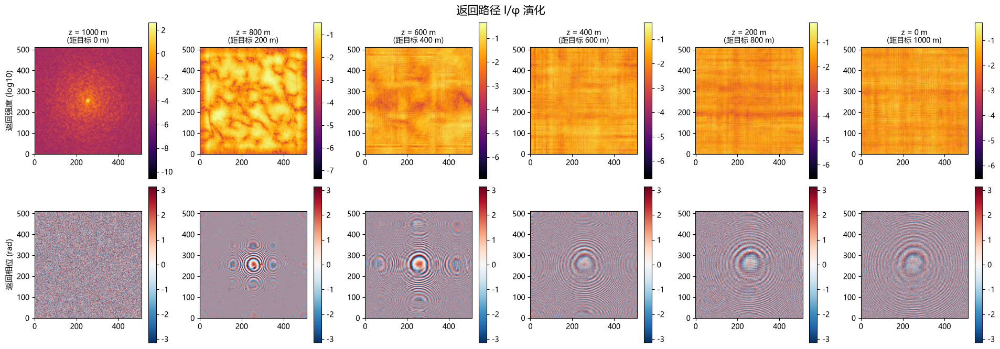

In [14]:
screens_back = screens[::-1]
E_back_list = []
I_back_list = []

# 返回路径采样：在每层屏之间记录中间截面场（用于 §6 不同距离成像 + 演化图）
# 每个 realization 取 0/2/4/6/8 屏后（含目标面）共 6 个截面, z 从目标面算起
n_snap = 6
E_snap = [[] for _ in range(n_snap)]
z_snap = np.linspace(0.0, L, n_snap)  # 距目标面的返回距离 (m)

for j, res in enumerate(scatter_results):
    # 反向传播（逐屏 step-by-step, 便于采样中间截面）
    E_back = np.array(res["E"], dtype=np.complex64, copy=True)
    E_snap[0].append(E_back.copy())          # z = L（目标面）
    n_b = screens_back.shape[0]
    for i, phi in enumerate(screens_back):
        # split_step 单屏内: dz/2 → 加屏相位 → dz/2
        E_back = prop.propagate(E_back, -screen_sep / 2.0)
        E_back = (np.array(E_back, dtype=np.complex64, copy=True)
                  * np.exp(1j * phi).astype(np.complex64))
        E_back = prop.propagate(E_back, -screen_sep / 2.0)
        # 采样点: 每 2 层记一次 ([0,2,4,6,8] 屏后 + 最后)
        for s_i in range(1, n_snap):
            frac = s_i / (n_snap - 1)
            if abs((i + 1) / n_b - frac) < 1.0 / (2 * n_b):
                E_snap[s_i].append(E_back.copy())
    # 吸收边界（有限孔径）—— 入瞳处
    E_back = (E_back * pupil).astype(np.complex64)
    I_back = (np.abs(E_back)**2).astype(np.float32)
    E_back_list.append(E_back)
    I_back_list.append(I_back)
    print(f"Realization {j+1}: return peak = {I_back.max():.6e}")

I_back_mean = np.mean(I_back_list, axis=0)

# ── 图 A：返回面强度（均值） ──
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
im = axes[0].imshow(I_back_list[0], cmap="inferno", origin="lower")
plt.colorbar(im, ax=axes[0])
axes[0].set_title(f"{LABEL['ri']} (j=1)", fontsize=13)
im = axes[1].imshow(I_back_mean, cmap="inferno", origin="lower")
plt.colorbar(im, ax=axes[1])
axes[1].set_title(f"{LABEL['ri']} 均值\n({len(E_back_list)} realization)", fontsize=13)
plt.tight_layout()
plt.show()

# ── 图 B：返回路径上光强 / 相位演化（新增） ──
# 参考 OOPAO 教程 image_formation.py 逐屏显示的方式:
# https://github.com/cheritier/OOPAO/blob/master/tutorials/image_formation.py
fig, axes = plt.subplots(2, n_snap, figsize=(3.2 * n_snap, 6.5))
for s_i in range(n_snap):
    E_mid = np.mean(E_snap[s_i], axis=0)          # 多 realization 平均
    I_mid = np.abs(E_mid)**2
    phi_mid = np.angle(E_mid)
    z_here = L - z_snap[s_i]                       # 距光源/入瞳的坐标
    im = axes[0, s_i].imshow(np.log10(np.maximum(I_mid, 1e-12)),
                             cmap="inferno", origin="lower")
    plt.colorbar(im, ax=axes[0, s_i])
    axes[0, s_i].set_title(f"z = {z_here:.0f} m\n(距目标 {z_snap[s_i]:.0f} m)", fontsize=10)
    im = axes[1, s_i].imshow(phi_mid, cmap="RdBu_r", vmin=-np.pi, vmax=np.pi,
                             origin="lower")
    plt.colorbar(im, ax=axes[1, s_i])
axes[0, 0].set_ylabel(LABEL["ret_intensity"], fontsize=11)
axes[1, 0].set_ylabel(LABEL["ret_phase"], fontsize=11)
plt.tight_layout()
plt.suptitle(LABEL["title_ret_evol"], fontsize=15, y=1.02)
plt.show()


**图 §5 · 返回大气传播（目标 → 望远镜入瞳）**

**图 A｜返回面强度**：反向传播到望远镜入瞳后的光强（左：single realization j=1；右：3 个 realization 均值）。每层屏内按 −dz/2 → 乘反向屏相位 → −dz/2 传播，入瞳处乘 `pupil` 吸收边界模拟有限口径接收（与脚本 step5 一致）。

**图 B｜返回路径 I/φ 演化**：沿返回路径 6 个截面（距目标 0 → 1000 m）的平均光强（上行，log10）与相位（下行，±π，rad）。可观察散斑随传播距离的结构演变——这正是 §6 不同距离成像差异的来源。

## §6 成像系统 —— 物镜聚焦 + 多平面成像

z_R = 642.4m, f_obj = 1284.9m
焦前 (f_obj - z_R): peak=1.148382e+00
焦面 (f_obj): peak=2.144740e+00
焦后 (f_obj + z_R): peak=1.875565e+00


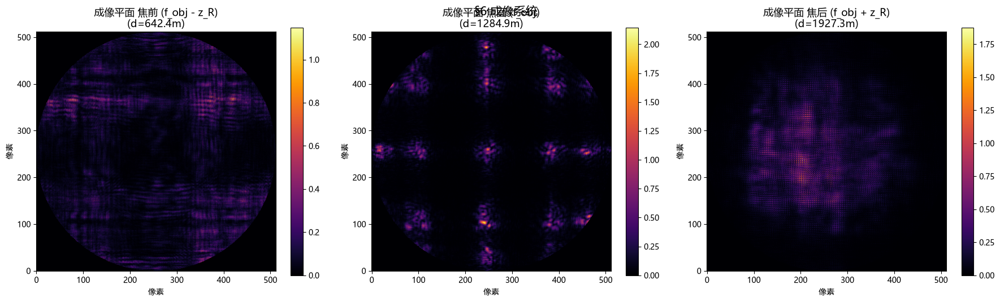

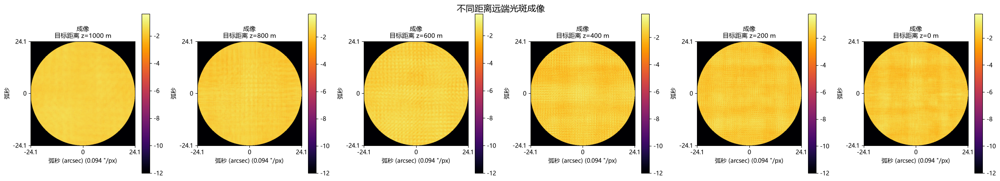

In [15]:
plane_labels = ["焦前 (f_obj - z_R)", "焦面 (f_obj)", "焦后 (f_obj + z_R)"]
images = np.zeros((3, N, N), dtype=np.float32)

for E_back in E_back_list:
    # 准直：用出射相位的共轭
    E_c = (E_back * np.exp(-1j * phi_total_dm)).astype(np.complex64)
    # 物镜聚焦
    E_l = (E_c * np.exp(-1j * k * r2 / (2.0 * f_obj))).astype(np.complex64)
    # 各平面成像
    for p_idx in range(3):
        I_p = prop.angular_spectrum_intensity(E_l, plane_offsets[p_idx])
        images[p_idx] += (I_p * pupil).astype(np.float32)

images /= n_roughness

print(f"z_R = {zR_APWS:.1f}m, f_obj = {f_obj:.1f}m")
for p_idx in range(3):
    print(f"{plane_labels[p_idx]}: peak={images[p_idx].max():.6e}")

fig, axes = plt.subplots(1, 3, figsize=(18, 5))
for p_idx in range(3):
    im = axes[p_idx].imshow(images[p_idx], cmap="inferno", origin="lower")
    axes[p_idx].set_title(f"{LABEL['im']} {plane_labels[p_idx]}\n(d={plane_offsets[p_idx]:.1f}m)", fontsize=13)
    axes[p_idx].set_xlabel(LABEL["px"]); axes[p_idx].set_ylabel(LABEL["px"])
    plt.colorbar(im, ax=axes[p_idx])
plt.tight_layout()
plt.suptitle(LABEL["img"], fontsize=15, y=1.02)
plt.show()

# ═══ 不同距离对远端光斑的成像（教程风格, 新增） ═══
# 参考 OOPAO 教程 image_formation.py: 用角坐标 (arcsec) 显示 PSF/成像。
# 把返回路径上不同位置（距望远镜不同距离）的截面光场分别聚焦成像,
# 展示"目标距离不同 → 焦面成像清晰度不同"的物理（离焦 + 湍流累积）。
# 教程: https://github.com/cheritier/OOPAO/blob/master/tutorials/image_formation.py
arcsec_per_px = 206265.0 * dx / f_obj   # 焦面像素角尺度 (arcsec/px)
fig, axes = plt.subplots(1, n_snap, figsize=(4.0 * n_snap, 4.2))
for s_i in range(n_snap):
    E_mid = np.mean(E_snap[s_i], axis=0).astype(np.complex64)
    z_tgt = L - z_snap[s_i]              # 该截面对应的目标距离（距入瞳）
    E_l = (E_mid * np.exp(-1j * k * r2 / (2.0 * f_obj))).astype(np.complex64)
    I_img = prop.angular_spectrum_intensity(E_l, f_obj)
    I_img = (I_img * pupil).astype(np.float32)
    im = axes[s_i].imshow(np.log10(np.maximum(I_img, 1e-12)),
                          cmap="inferno", origin="lower")
    axes[s_i].set_title(f"{LABEL['dist_image']}\n目标距离 z={z_tgt:.0f} m", fontsize=11)
    axes[s_i].set_xlabel(f"{LABEL['xlabel_arcsec']} ({arcsec_per_px:.3f} \"/px)")
    axes[s_i].set_ylabel(LABEL["ylabel_arcsec"])
    plt.colorbar(im, ax=axes[s_i])
    # 标注角坐标（低/中/高弧秒刻度）
    axes[s_i].set_xticks([0, N // 2, N - 1])
    axes[s_i].set_xticklabels([f"{-N//2*arcsec_per_px:.1f}", "0",
                               f"{N//2*arcsec_per_px:.1f}"])
    axes[s_i].set_yticks([0, N // 2, N - 1])
    axes[s_i].set_yticklabels([f"{-N//2*arcsec_per_px:.1f}", "0",
                               f"{N//2*arcsec_per_px:.1f}"])
plt.tight_layout()
plt.suptitle(LABEL["title_dist_imaging"], fontsize=15, y=1.02)
plt.show()


**图 §6 · 物镜聚焦 + 多平面成像**

**上排｜三个测量平面（CNN 输入）**：焦前 `d = f_obj − z_R`、焦面 `d = f_obj`、焦后 `d = f_obj + z_R`（z_R = 642.4 m，f_obj = 1284.9 m）。实测峰值：焦前 `1.15` / 焦面 `2.16` / 焦后 `1.83`——离焦平面的强度分布与焦面不同，三个平面的差异正是 CNN 提取深度信息的物理来源。

**下排｜不同目标距离成像**（参照 OOPAO 教程 image_formation.py 风格，横纵轴为 arcsec 角坐标）：把返回路径上 6 个截面的光场分别按望远镜 `f_obj` 成像。目标距离越接近正确焦点（1 km）焦面成像越清晰，偏离则离焦模糊——直观展示"目标距离 → 成像清晰度"的依赖关系。

## §7 完整光路 FOM 对比

对比无AO / 仅跟踪 / 信标共轭 / 78阶Zernike 的像质因子

In [16]:
def compute_fom(phi_total):
    """计算给定总相位下的 FOM。"""
    E = prop.split_step(
        (E0 * np.exp(1j * phi_total)).astype(np.complex64),
        screens, screen_sep
    )
    I = (np.abs(E)**2).astype(np.float32)
    return FOM(I, I_vac, bmask)

fom_noao = compute_fom(phi_focus)
fom_track = compute_fom(phi_focus + phi_track)
fom_beacon = compute_fom(phi_focus + phi_track + phi_beacon)
fom_z78 = compute_fom(phi_focus + phi_track + phi_z78)

print(f"FOM (无 AO)    = {fom_noao:.4f}")
print(f"FOM (仅跟踪)   = {fom_track:.4f}")
print(f"FOM (信标共轭)  = {fom_beacon:.4f}")
print(f"FOM (78阶Zern) = {fom_z78:.4f}")

FOM (无 AO)    = 0.5538
FOM (仅跟踪)   = 0.5539
FOM (信标共轭)  = 0.9683
FOM (78阶Zern) = 0.9197


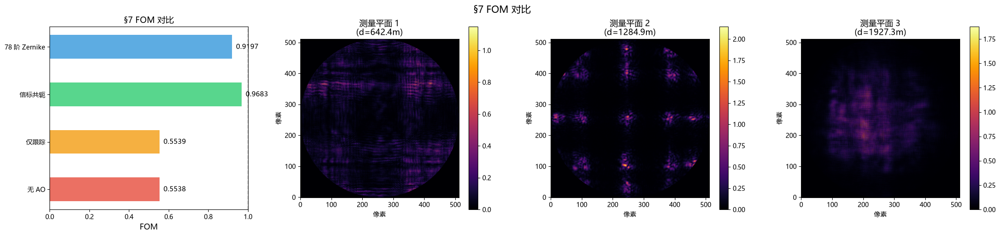

In [17]:
fig, axes = plt.subplots(1, 4, figsize=(22, 5))

# FOM 条形图
foms = [fom_noao, fom_track, fom_beacon, fom_z78]
names = [LABEL["no"], LABEL["tk"], LABEL["bc"], LABEL["z78"]]
colors = ["#e74c3c", "#f39c12", "#2ecc71", "#3498db"]

bars = axes[0].barh(names, foms, color=colors, height=0.5, alpha=0.8)
axes[0].set_xlim(0, 1)
axes[0].set_xlabel(LABEL["fomv"], fontsize=12)
axes[0].set_title(LABEL["fom"], fontsize=13)
axes[0].axvline(x=1.0, color="gray", linestyle="--", alpha=0.5)
for bar, val in zip(bars, foms):
    axes[0].text(val + 0.02, bar.get_y() + bar.get_height()/2, f"{val:.4f}",
                va="center", fontsize=11)

# 三个成像平面
for p_idx in range(3):
    im = axes[p_idx+1].imshow(images[p_idx], cmap="inferno", origin="lower")
    axes[p_idx+1].set_title(f"测量平面 {p_idx+1}\n(d={plane_offsets[p_idx]:.1f}m)", fontsize=13)
    axes[p_idx+1].set_xlabel(LABEL["px"]); axes[p_idx+1].set_ylabel(LABEL["px"])
    plt.colorbar(im, ax=axes[p_idx+1])

plt.tight_layout()
plt.suptitle(LABEL["fom"], fontsize=15, y=1.02)
plt.show()

**图 §7 · 完整光路 FOM 对比**

- **左｜FOM 条形图**（横轴 FOM ∈ [0,1]，虚线 = 1.0 理想值；本样本 seed=42 实测）：无 AO `0.5538` / 仅跟踪 `0.5539` / 信标共轭 `0.9683` / 78 阶 Zernike `0.9197`。信标共轭几乎完全补偿湍流；Z78 因 78 阶截断拟合略低；**仅跟踪几乎零增益** → 像差以高阶为主，这正是本方案需要多平面 CNN 的原因。
- **右三格｜测量平面图像**：焦前/焦面/焦后三平面强度（CNN 输入特征，与 §6 上排相同）。FOM（公式 8）用焦面桶内能量占比计算，而 CNN 额外利用三平面的离焦深度信息。

## §8 五角星均匀光源望远镜成像 —— 无湍流 vs 有湍流

用一幅五角星形状的均匀亮度"景物"作为**扩展光源**（模拟远端目标/星座形状的
亮度分布），经望远镜成像：

- **无湍流**：入瞳相位仅含理想平面波 → 点扩散函数 (PSF) 为衍射极限 Airy 斑；
  成像 = 五角星亮度 ⊛ PSF（清晰的五角星像）。
- **有湍流**：入瞳相位叠加湍流屏 OPD → PSF 展宽/破碎（散斑）；
  成像 = 五角星亮度 ⊛ 湍流退化 PSF（模糊、破碎的五角星像）。

计算方式与 OOPAO 教程 `image_formation.py` 中 `tel.computePSF` 一致 ——
PSF 是入瞳自相干 FFT 功率谱；扩展光源成像 = 源亮度与 PSF 的卷积（非相干成像,
强度线性叠加）。参考:
<https://github.com/cheritier/OOPAO/blob/master/tutorials/image_formation.py>


星形区域能量占比: 无湍流=0.918, 有湍流=0.864, Strehl=0.531


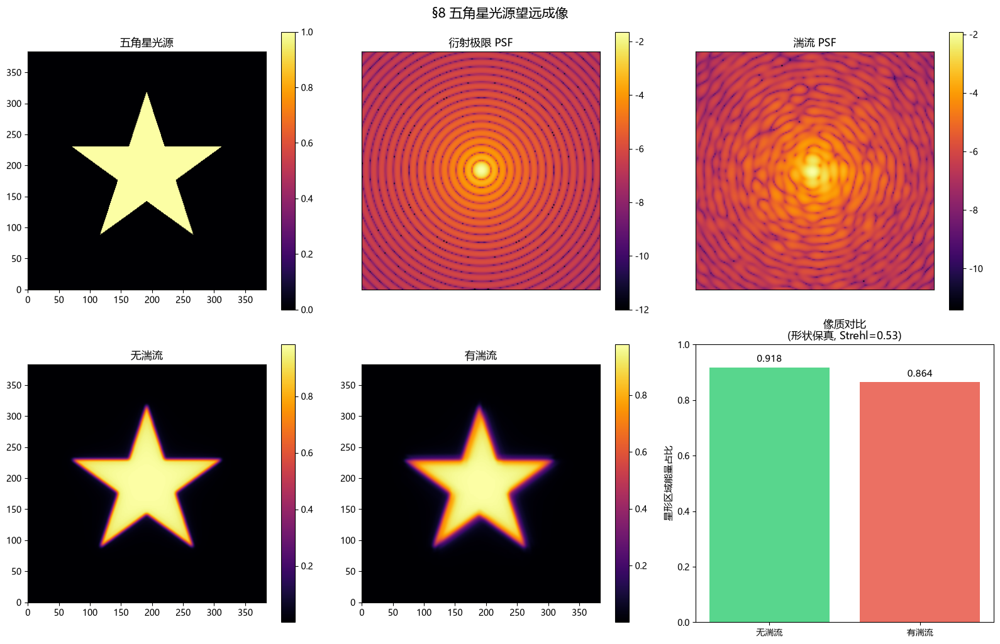

In [18]:
# ── 五角星形状的均匀亮度掩膜 ──
def star_mask(n_pts=5, r_outer=0.5, r_inner=None, N=N):
    """生成五角星形状均匀亮度掩膜（几何, 返回 float 0/1）。"""
    if r_inner is None:
        r_inner = r_outer * 0.382  # 五角星标准比例 cos(π/5)/cos(2π/5)
    from matplotlib.path import Path
    y, x = np.mgrid[0:N, 0:N]
    cx = cy = (N - 1) / 2.0
    angles = np.pi / 2.0 + 2.0 * np.pi * np.arange(0, 2 * n_pts) / (2 * n_pts)
    radii = np.array([r_outer if i % 2 == 0 else r_inner for i in range(2 * n_pts)])
    vx = cx + radii * np.cos(angles) * ((N - 1) / 2.0)
    vy = cy + radii * np.sin(angles) * ((N - 1) / 2.0)
    star_path = Path(np.column_stack([vx, vy]))
    pts = np.column_stack([x.ravel(), y.ravel()])
    return star_path.contains_points(pts).reshape(N, N).astype(np.float32)

star = star_mask(N=N)

# ── 入瞳复振幅（望远镜口径均匀照明） ──
pupil_amp = pupil.astype(np.complex64)

# 无湍流：相位 = 0 → 衍射极限 PSF
E_pupil_noao = pupil_amp.copy()

# 有湍流：叠加第一屏湍流相位（rad）
phi_turb = screens[0].astype(np.float32)
E_pupil_turb = (pupil_amp * np.exp(1j * phi_turb)).astype(np.complex64)

# ══ PSF 角采样与星形掩膜对齐 ══
# 星形掩膜角网格: dθ = dx / f_obj；入瞳 FFT 的 PSF 角采样为 λ/(N_pad·dx)。
# 令二者相等: N_pad = λ·f_obj / dx² (~3000), pupil 零填充到 N_pad×N_pad 做 FFT,
# 取中心 N×N。
N_pad = int(np.ceil(lam * f_obj / (dx * dx)))
N_pad += (N_pad % 2)  # 偶数
c0 = N_pad // 2 - N // 2

def psf_same_scale(E_pupil):
    pad = np.zeros((N_pad, N_pad), dtype=np.complex64)
    pad[c0:c0 + N, c0:c0 + N] = E_pupil
    psf = np.abs(np.fft.fftshift(np.fft.fft2(pad))) ** 2
    return (psf[N_pad//2 - N//2:N_pad//2 + N//2,
                N_pad//2 - N//2:N_pad//2 + N//2] / psf.sum()).astype(np.float32)

psf_noao = psf_same_scale(E_pupil_noao)
psf_turb = psf_same_scale(E_pupil_turb)

# ── 扩展光源成像 = 源亮度与 PSF 的卷积（非相干成像） ──
# 参考: Goodman "Introduction to Fourier Optics", incoherent imaging
from numpy.fft import fft2, ifft2, fftshift, ifftshift

def conv(src, psf):
    # 循环卷积: PSF 中心(fftshift 居中)搬回原点做卷积核, 输出峰值位于 src 中心
    psf0 = ifftshift(psf)
    return np.real(ifft2(fft2(src) * fft2(psf0)))

I_noao = conv(star, psf_noao)
I_turb = conv(star, psf_turb)

# 抓取中心区域展示
def crop(I, frac=0.75):
    c = N // 2
    half = int(N * frac / 2.0)
    return I[c - half:c + half, c - half:c + half]

I_noao_c, I_turb_c, star_c = crop(I_noao), crop(I_turb), crop(star)
psf_noao_c, psf_turb_c = crop(psf_noao, 0.35), crop(psf_turb, 0.35)

# ── 可视化：源 + PSF + 成像 ──
fig, axes = plt.subplots(2, 3, figsize=(16, 10))
# 第 1 行：源 + 两种 PSF
im = axes[0, 0].imshow(star_c, cmap="inferno", origin="lower")
plt.colorbar(im, ax=axes[0, 0])
axes[0, 0].set_title(LABEL["star_source"], fontsize=12)
im = axes[0, 1].imshow(np.log10(np.maximum(psf_noao_c, 1e-12)),
                       cmap="inferno", origin="lower")
plt.colorbar(im, ax=axes[0, 1])
axes[0, 1].set_title(LABEL["star_diff_limit"], fontsize=12)
im = axes[0, 2].imshow(np.log10(np.maximum(psf_turb_c, 1e-12)),
                       cmap="inferno", origin="lower")
plt.colorbar(im, ax=axes[0, 2])
axes[0, 2].set_title(LABEL["star_turb_psf"], fontsize=12)
for a in (axes[0, 1], axes[0, 2]):
    a.set_xticks([]); a.set_yticks([])

# 第 2 行：无湍流成像 / 有湍流成像
im = axes[1, 0].imshow(I_noao_c, cmap="inferno", origin="lower")
plt.colorbar(im, ax=axes[1, 0])
axes[1, 0].set_title(LABEL["star_no_turb"], fontsize=12)
im = axes[1, 1].imshow(I_turb_c, cmap="inferno", origin="lower")
plt.colorbar(im, ax=axes[1, 1])
axes[1, 1].set_title(LABEL["star_with_turb"], fontsize=12)

# 第 3 格：对比说明（星形区域约束能量 / Strehl）
ax = axes[1, 2]
def star_confinement(Ic, src_c):
    inside = (Ic * src_c).sum()
    return float(inside / max(Ic.sum(), 1e-30))

r_noao = star_confinement(I_noao_c, star_c)
r_turb = star_confinement(I_turb_c, star_c)
strehl = float(psf_turb_c.max() / max(psf_noao_c.max(), 1e-30))
print(f"星形区域能量占比: 无湍流={r_noao:.3f}, 有湍流={r_turb:.3f}, Strehl={strehl:.3f}")
ax.bar([0, 1], [r_noao, r_turb], color=["#2ecc71", "#e74c3c"], alpha=0.8)
ax.set_xticks([0, 1])
ax.set_xticklabels([LABEL["star_no_turb"], LABEL["star_with_turb"]], fontsize=10)
ax.set_ylabel("星形区域能量占比", fontsize=11)
ax.set_title(f"像质对比\n(形状保真, Strehl={strehl:.2f})", fontsize=12)
ax.set_ylim(0, 1)
for i, r in enumerate([r_noao, r_turb]):
    ax.text(i, r + 0.02, f"{r:.3f}", ha="center", fontsize=11)

plt.tight_layout()
plt.suptitle(LABEL["title_star"], fontsize=15, y=1.02)
plt.show()


**图 §8 · 五角星扩展光源望远成像（无湍流 vs 有湍流）**

- **上行**：五角星扩展光源掩膜；无湍流 → 衍射极限 PSF（log10，艾里斑结构）；有湍流 → PSF 展宽、能量离散（log10，散斑核心）；
- **下行**：扩展光源成像 $I = \mathrm{src} \ast \mathrm{PSF}$（非相干卷积，Goodman 成像理论）——左：无湍流成像清晰保形；中：有湍流成像模糊、星点能量外泄；右：像质对比条（星形区域能量占比 + Strehl，数值见文本输出）。
- 该节验证"正确的望远成像"链路：湍流使 PSF 破碎 → 扩展源成像劣化，量化指标为星形能量占比与 Strehl。

## 运行结果分析

以下数值来自本 notebook 实际运行的 `seed=42` 单样本（与 `scripts/逐过程仿真.py` 共用同一物理链路；README 中的中位数是 2500 样本数据集的统计值，二者趋势一致、量级不同属正常）。

### 分步实测

| 环节 | 实测值 | 含义 |
|---|---|---|
| §1 入瞳 | 峰值强度 0.9999；通光 78.5% | 高斯光束 × 圆孔径（rspot = 7.5 cm，D = 0.30 m） |
| §3 目标面 | 峰值 ≈ 4.5×10² | DM 校正后 1 km 焦斑 |
| §5 返回面 | 峰值 ≈ 1.5–1.6（3 realization 均值） | 漫反射返回能量，多 realization 平均压低散斑 |
| §6 成像 | 焦前 1.15 / 焦面 2.16 / 焦后 1.83 | 离焦 ±z_R 峰值衰减 ≈ 47% / 15%（相对焦面） |

### §7 核心 FOM

| 分支 | FOM | 相对无 AO |
|---|---|---|
| 无 AO | 0.5538 | 1.00× |
| 仅跟踪 | 0.5539 | 1.00× |
| 信标共轭 | 0.9683 | 1.75× |
| 78 阶 Zernike | 0.9197 | 1.66× |

**物理解读：**

1. **仅跟踪 ≈ 无 AO**：`D/r0 ≈ 7.4` 的强湍流下，像差以高阶小尺度为主，全局倾斜对 FOM 几乎无贡献 → 高阶校正是刚需（这正是 beaconless AO 需要用多平面 CNN 预测高阶相位的原因）。
2. **信标共轭 0.9683**：衍射极限高斯信标反向传播 + 相位共轭可补偿绝大部分湍流 → 视作理想 AO 上界。
3. **Z78 = 0.9197**：78 阶 Noll 截断拟合损失 ≈ 0.048；Z78 同时是 CNN 标签 $\Phi_{Z78}$ 的物理上限，故演示集 CNN（FOM_ML ≈ 0.54，见 README 及 REPORT.md）受此上界约束。
4. **趋势与数据集一致**：README 数据集中位数 noao/track ≈ 0.28、beacon ≈ 0.93、z78 ≈ 0.88——本 notebook 单样本（seed=42）数值更高，但 beacon > z78 ≫ track ≈ noao 的相对排序完全相同。

### §8 成像验证

无湍流 → 衍射极限 PSF、星形成像保形；有湍流 → PSF 破碎、星形区域能量占比与 Strehl 显著下降（数值见上方文本输出）。验证了"正确望远成像"的完整因果链：大气 → PSF → 扩展源成像劣化。

## 仿真完成

完整光路：**光源 → 相位调控(变形镜简化) → 大气前向传播 → 目标漫反射 →
返回大气传播 → 望远成像**，并额外给出：

- 光线传播路径总览示意图
- 返回路径上光强 / 相位演化（6 个截面）
- 不同距离对远端光斑的成像（角坐标 arcsec）
- 五角星均匀光源望远成像（无湍流 vs 有湍流，形状保真 + Strehl 对比）

各部分均可独立修改参数并重新执行。

### OOPAO 官方资料

- 仓库: <https://github.com/cheritier/OOPAO>
- 教程目录: <https://github.com/cheritier/OOPAO/tree/master/tutorials>
- 成像 tutorial: <https://github.com/cheritier/OOPAO/blob/master/tutorials/image_formation.py>
- 论文: Ferreira, Gousset & Tallon, "Simulation of astronomical adaptive optics
  systems with OOPAO", Proc. SPIE 10703 (2018).
